# Mobile Price Clustering

This project has been built as a part of a learning process of IBM's Unsupervised Learning course. The dataset choosen here is the `Mobile Price Classification` dataset. Several clsutering algorithms have been implemented like K-Means, Agglomerative, DBScan and Mean Shift and their results are thoroughly analyzed. It is analyzed that DBScan performs better than the rest.



In [1]:
# Importing the required libraries for visualization
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
# os.chdir('data')

# Visualization Prefrences.
%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

In [2]:
%pip install xlrd==1.2.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.3/103.3 kB 1.0 MB/s eta 0:00:00
  Attempting uninstall: xlrd
    Found existing installation: xlrd 2.0.1
    Uninstalling xlrd-2.0.1:
      Successfully uninstalled xlrd-2.0.1


## 01- Data Description Section

In this data:
* `id`:ID
* `battery_power`:Total energy a battery can store in one time measured in mAh
* `blue`:Has bluetooth or not
* `clock_speed`:speed at which microprocessor executes instructions
* `dual_sim`:Has dual sim support or not
* `fc`:Front Camera mega pixels
* `four_g`:Has 4G or not
* `int_memory`:Internal Memory in Gigabytes
* `m_dep`:Mobile Depth in cm
* `mobile_wt`:Weight of mobile phone
* `n_cores`:Number of cores of processor
* `pc`:Primary Camera mega pixels
* `px_height`:Pixel Resolution Height
* `px_width`:Pixel Resolution Width
* `ram`:Random Access Memory in Megabytes
* `sc_h`:Screen Height of mobile in cm
* `sc_w`:Screen Width of mobile in cm
* `talk_time`:longest time that a single battery charge will last when you are
* `three_g`:Has 3G or not
* `touch_screen`:Has touch screen or not
* `wifi`:Has wifi or not

USE CASE:

This kind of prediction will help companies estimate price of mobiles to give tough competion to other mobile manufacturer
Also it will be usefull for Consumers to verify that they are paying best price for a mobile.

In [3]:
# Data Retrieving
# excel_file_path = "DryBeanDataset\Dry_Bean_Dataset.xlsx"

# df = pd.read_excel(excel_file_path,  sheet_name="sheet1", )
df=pd.read_csv("/content/train.csv")
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [4]:
df.shape

(2000, 21)

In [5]:
# Extract Descriptive Data.
pd.set_option("display.float", "{:.2f}".format)
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,...,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00
mean,1238.52,0.49,1.52,0.51,4.31,0.52,32.05,0.50,140.25,4.52,...,645.11,1251.52,2124.21,12.31,5.77,11.01,0.76,0.50,0.51,1.50
std,439.42,0.50,0.82,0.50,4.34,0.50,18.15,0.29,35.40,2.29,...,443.78,432.20,1084.73,4.21,4.36,5.46,0.43,0.50,0.50,1.12
min,501.00,0.00,0.50,0.00,0.00,0.00,2.00,0.10,80.00,1.00,...,0.00,500.00,256.00,5.00,0.00,2.00,0.00,0.00,0.00,0.00
25%,851.75,0.00,0.70,0.00,1.00,0.00,16.00,0.20,109.00,3.00,...,282.75,874.75,1207.50,9.00,2.00,6.00,1.00,0.00,0.00,0.75
50%,1226.00,0.00,1.50,1.00,3.00,1.00,32.00,0.50,141.00,4.00,...,564.00,1247.00,2146.50,12.00,5.00,11.00,1.00,1.00,1.00,1.50
75%,1615.25,1.00,2.20,1.00,7.00,1.00,48.00,0.80,170.00,7.00,...,947.25,1633.00,3064.50,16.00,9.00,16.00,1.00,1.00,1.00,2.25
max,1998.00,1.00,3.00,1.00,19.00,1.00,64.00,1.00,200.00,8.00,...,1960.00,1998.00,3998.00,19.00,18.00,20.00,1.00,1.00,1.00,3.00


## 02- Exploratory Data Analysis (EDA) & Feature Engineering Section

In [6]:
# Check for Null Values
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [7]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

   price_range
1          500
2          500
3          500
0          500


<Axes: title={'center': 'Price Counts'}>

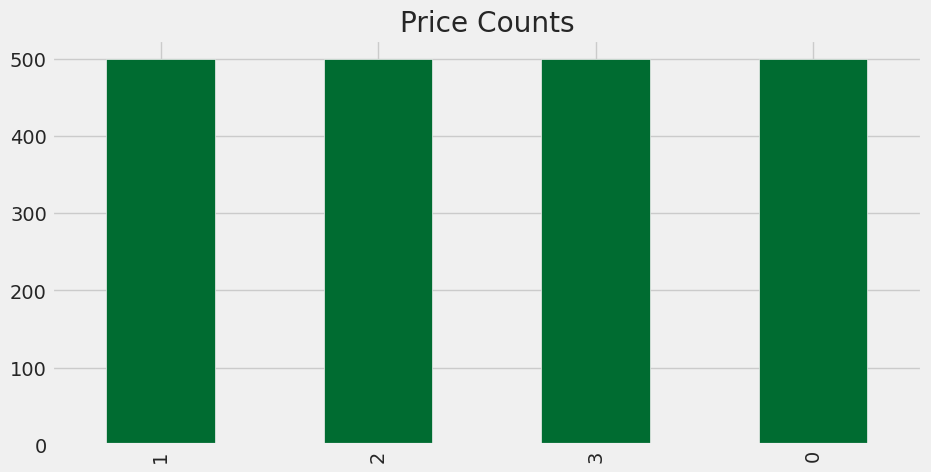

In [8]:
df_class_counts = df.price_range.value_counts().to_frame()
print(df_class_counts)
df.price_range.value_counts().plot(kind="bar", color='#006C31', figsize=(10,5), title = 'Price Counts')

In [12]:
# Check the percentage of each class
df_class_perc = df.price_range.value_counts(normalize=True).to_frame()
print(df_class_perc)
df_class_perc["price_range"] = df_class_perc["price_range"] * 100
df_class_perc.rename(columns = {"price_range": "price_range%"}, inplace=True)
df_class_perc

   price_range
1         0.25
2         0.25
3         0.25
0         0.25


,price_range%
1,25.00
2,25.00
3,25.00
0,25.00


(21.5, -0.5)

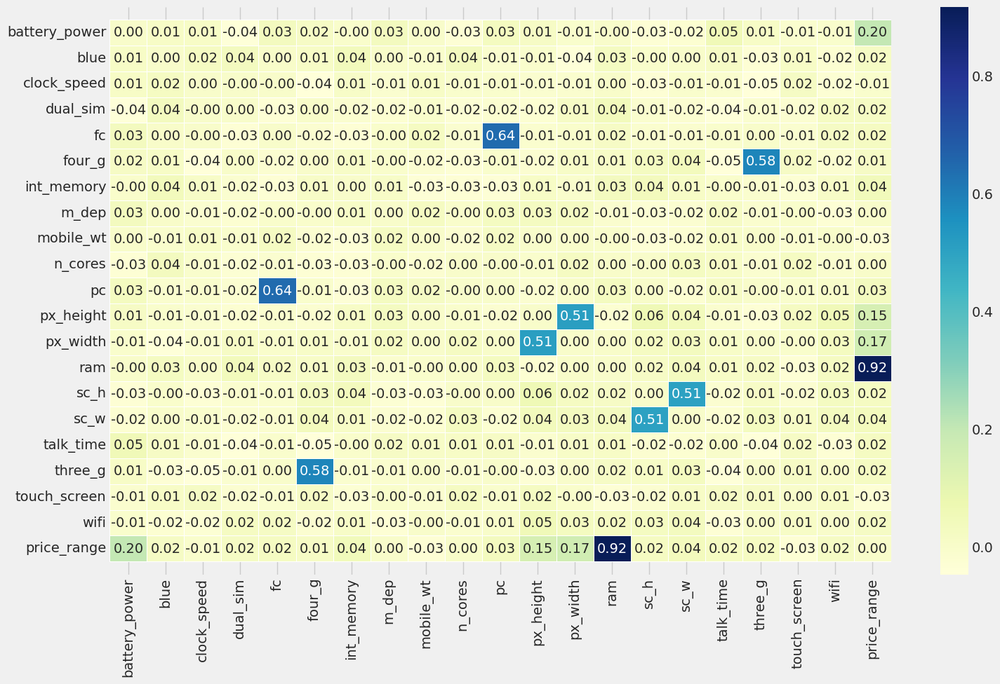

In [13]:
# Studying the correlations between features using Heat Map!
corr_matrix = df.corr()
for x in range(corr_matrix.shape[0]):
    corr_matrix.iloc[x,x] = 0.0

fig, ax = plt.subplots(figsize=(16, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [14]:
# The correlation matrix
corr_mat = df.corr()

# Strip out the diagonal values for the next step
for x in range(corr_mat.shape[0]):
    corr_mat.iloc[x,x] = 0.0

corr_mat

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,0.00,0.01,0.01,-0.04,0.03,0.02,-0.00,0.03,0.00,-0.03,...,0.01,-0.01,-0.00,-0.03,-0.02,0.05,0.01,-0.01,-0.01,0.20
blue,0.01,0.00,0.02,0.04,0.00,0.01,0.04,0.00,-0.01,0.04,...,-0.01,-0.04,0.03,-0.00,0.00,0.01,-0.03,0.01,-0.02,0.02
clock_speed,0.01,0.02,0.00,-0.00,-0.00,-0.04,0.01,-0.01,0.01,-0.01,...,-0.01,-0.01,0.00,-0.03,-0.01,-0.01,-0.05,0.02,-0.02,-0.01
dual_sim,-0.04,0.04,-0.00,0.00,-0.03,0.00,-0.02,-0.02,-0.01,-0.02,...,-0.02,0.01,0.04,-0.01,-0.02,-0.04,-0.01,-0.02,0.02,0.02
fc,0.03,0.00,-0.00,-0.03,0.00,-0.02,-0.03,-0.00,0.02,-0.01,...,-0.01,-0.01,0.02,-0.01,-0.01,-0.01,0.00,-0.01,0.02,0.02
four_g,0.02,0.01,-0.04,0.00,-0.02,0.00,0.01,-0.00,-0.02,-0.03,...,-0.02,0.01,0.01,0.03,0.04,-0.05,0.58,0.02,-0.02,0.01
int_memory,-0.00,0.04,0.01,-0.02,-0.03,0.01,0.00,0.01,-0.03,-0.03,...,0.01,-0.01,0.03,0.04,0.01,-0.00,-0.01,-0.03,0.01,0.04
m_dep,0.03,0.00,-0.01,-0.02,-0.00,-0.00,0.01,0.00,0.02,-0.00,...,0.03,0.02,-0.01,-0.03,-0.02,0.02,-0.01,-0.00,-0.03,0.00
mobile_wt,0.00,-0.01,0.01,-0.01,0.02,-0.02,-0.03,0.02,0.00,-0.02,...,0.00,0.00,-0.00,-0.03,-0.02,0.01,0.00,-0.01,-0.00,-0.03
n_cores,-0.03,0.04,-0.01,-0.02,-0.01,-0.03,-0.03,-0.00,-0.02,0.00,...,-0.01,0.02,0.00,-0.00,0.03,0.01,-0.01,0.02,-0.01,0.00


In [15]:
# Pairwise maximal correlations
corr_max  = corr_mat.abs().max().to_frame()
corr_id_max = corr_mat.abs().idxmax().to_frame()

# dataframe aggrigation and processing
pair_features_corr = pd.merge(corr_id_max, corr_max, on = corr_max.index)
pair_features_corr = pair_features_corr.rename(columns = {'key_0':'Feature_one', '0_x':'Feature_two', '0_y':'correlation'})\
                                                .sort_values('correlation', ascending=False)\
                                                .reset_index().drop('index', axis=1)
pair_features_corr


,Feature_one,Feature_two,correlation
0,price_range,ram,0.92
1,ram,price_range,0.92
2,fc,pc,0.64
3,pc,fc,0.64
4,three_g,four_g,0.58
5,four_g,three_g,0.58
6,px_width,px_height,0.51
7,px_height,px_width,0.51
8,sc_w,sc_h,0.51
9,sc_h,sc_w,0.51


How does ram is affected by price?

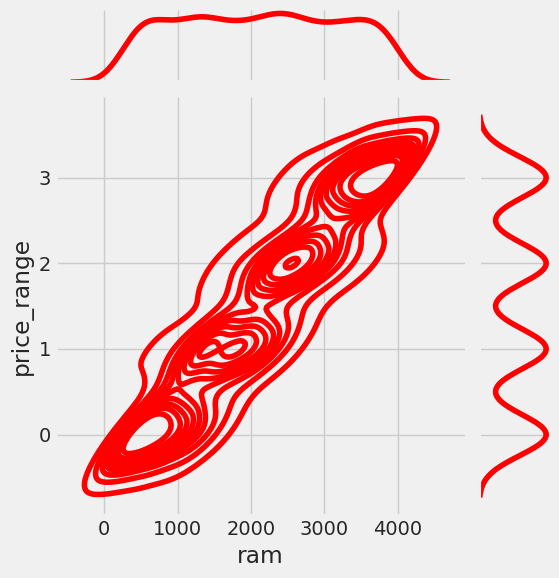

In [16]:
sns.jointplot(x='ram',y='price_range',data=df,color='red',kind='kde')

% of Phones which support 3G:

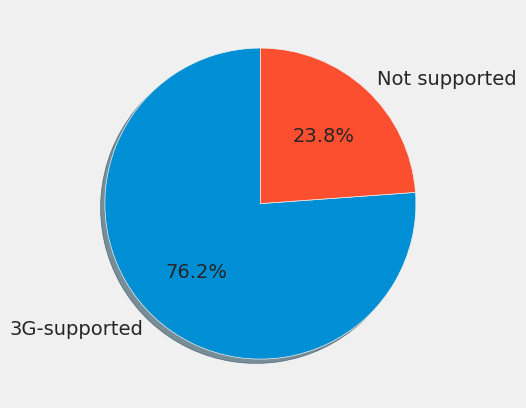

In [17]:
labels = ["3G-supported",'Not supported']
values=df['three_g'].value_counts().values
fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

% of Phones which support 4G:

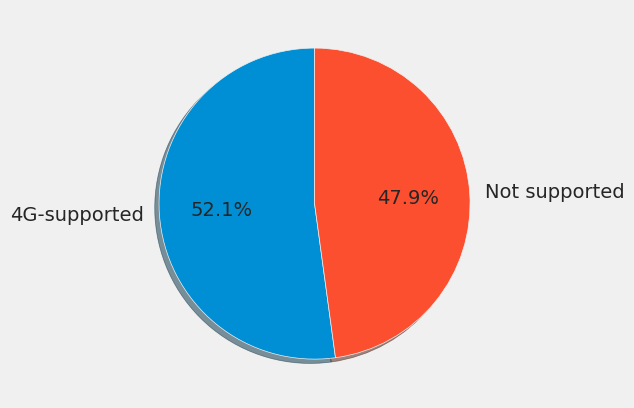

In [18]:
labels4g = ["4G-supported",'Not supported']
values4g = df['four_g'].value_counts().values
fig1, ax1 = plt.subplots()
ax1.pie(values4g, labels=labels4g, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

No of Phones vs Camera megapixels of front and primary camera:

Text(0.5, 0, 'MegaPixels')

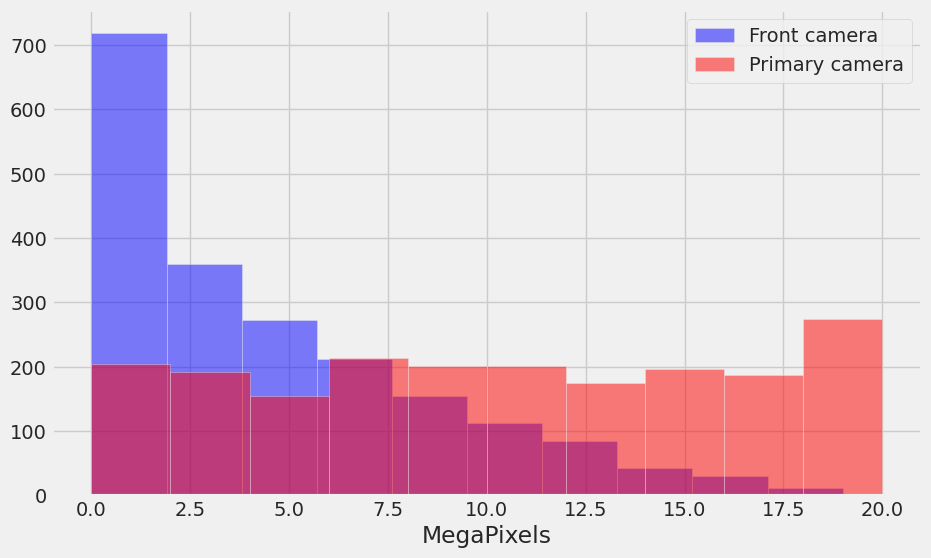

In [19]:
plt.figure(figsize=(10,6))
df['fc'].hist(alpha=0.5,color='blue',label='Front camera')
df['pc'].hist(alpha=0.5,color='red',label='Primary camera')
plt.legend()
plt.xlabel('MegaPixels')

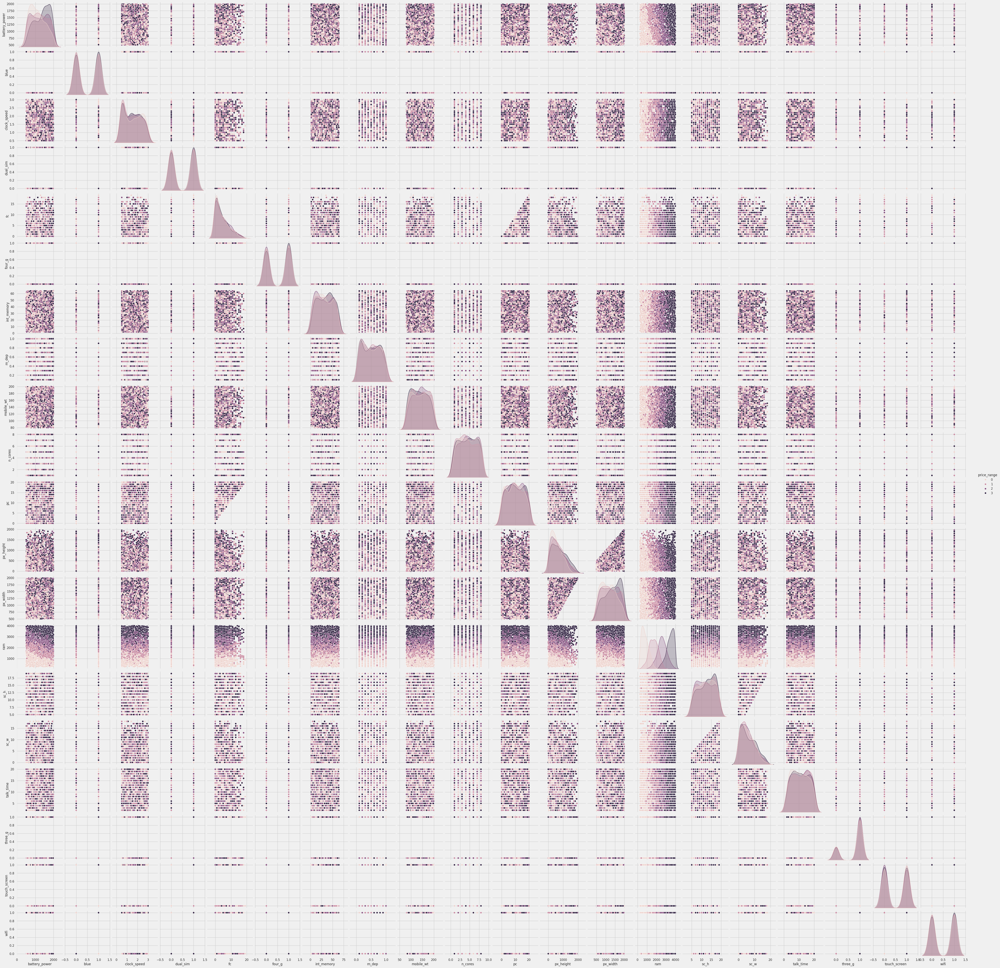

In [20]:
float_columns = [col for col in df.columns if col != 'price_range']

sns.set_context('notebook')
sns.pairplot(df[float_columns + ['price_range']],
             hue='price_range'
             );
### END SOLUTION

And an examination of the skew values in anticipation of transformations.
- 0 : no skew
- pos : right skew
- neg : left skew

In [21]:
skew_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_columns

,skewness_value
fc,1.02
px_height,0.67
sc_w,0.63
clock_speed,0.18
m_dep,0.09
int_memory,0.06
battery_power,0.03
blue,0.02
pc,0.02
px_width,0.01


In [22]:
skew_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_columns = skew_columns.query('skewness_value > 0.75')
skew_columns

,skewness_value
fc,1.02


In [23]:
# Perform log transform on skewed columns
for col in skew_columns['skewness_value'].index.tolist():
    df[col] = np.log1p(df[col])

In [24]:
skew_trans_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_trans_columns

,skewness_value
px_height,0.67
sc_w,0.63
clock_speed,0.18
m_dep,0.09
int_memory,0.06
battery_power,0.03
blue,0.02
pc,0.02
px_width,0.01
talk_time,0.01


In [25]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc               float64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [26]:
df.head(7)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.20,0,0.69,0,7,0.60,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.50,1,0.00,1,53,0.70,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.50,1,1.10,1,41,0.90,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.50,0,0.00,0,10,0.80,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.20,0,2.64,1,44,0.60,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.50,1,1.39,0,22,0.70,164,1,...,1004,1654,1067,17,1,10,1,0,0,1
6,1821,0,1.70,0,1.61,1,10,0.80,139,8,...,381,1018,3220,13,8,18,1,0,1,3


In [28]:
from sklearn.preprocessing import StandardScaler
# columns=['ram','fc','pc']
# float_columns = [col for col in df.columns if col in columns]
X=df[['ram','fc','pc','three_g','four_g','price_range']]
sc = StandardScaler()
X_scaled= sc.fit_transform(X)


In [30]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_PCA = pd.DataFrame(pca.fit_transform(X_scaled), columns=[f'Component {i}' for i in range(pca.n_components_)])
# (Remember it's technically "Projection onto Component {i}")
X_PCA.head()

,Component 0,Component 1
0,0.45,-0.54
1,-0.44,-1.83
2,-0.58,-1.04
3,-0.50,-1.00
4,0.41,1.12


## 03- Machine Learning Section : clusterning methods


### 1- K-means Algorithm

In [31]:
### BEGIN SOLUTION
from sklearn.cluster import KMeans

# Create and fit a range of models
km_list = list()

for clust in range(1,21):
    km = KMeans(n_clusters=clust, random_state=42, init = 'k-means++')
    km = km.fit(X_PCA)

    km_list.append(pd.Series({'clusters': clust,
                              'inertia': km.inertia_,
                              'model': km}))




/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

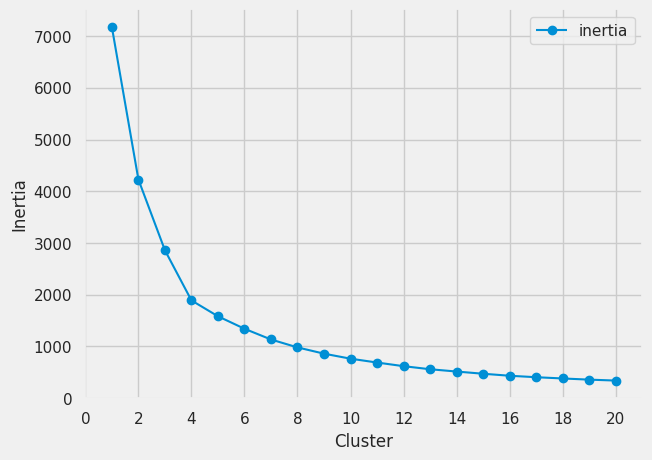

In [32]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel='Inertia');
### END SOLUTION

In [33]:
price_classes = pd.merge(df_class_counts, df_class_perc, on = df_class_counts.index)
price_classes.rename(columns={'key_0':'class_name'}, inplace=True)
price_classes

,class_name,price_range,price_range%
0,1,500,25.00
1,2,500,25.00
2,3,500,25.00
3,0,500,25.00


Kmeans with 5 clusters:

In [35]:
### BEGIN SOLUTION
km = KMeans(n_clusters=5, random_state=42,init='k-means++')
km = km.fit(X_PCA)
df['k-means'] = km.predict(X_PCA)
df.sample(7)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range,k-means
1392,1686,1,0.50,1,1.61,0,28,0.80,182,5,...,1073,780,11,10,5,0,0,0,0,2
1731,1066,0,3.00,1,1.95,1,5,0.50,167,5,...,1504,1044,8,7,11,1,0,0,0,4
176,685,0,0.50,0,1.10,0,29,0.80,93,7,...,648,728,14,8,4,0,0,1,0,2
1948,748,0,1.40,0,0.00,0,25,1.00,110,7,...,709,1974,17,5,13,0,1,1,1,0
1198,708,0,1.90,0,0.00,0,26,0.30,116,7,...,620,1419,10,6,16,1,1,1,0,4
1048,1960,1,2.10,0,0.69,0,7,0.20,165,7,...,877,3773,11,9,6,0,1,1,3,1
526,535,1,0.50,1,2.20,1,54,0.50,145,8,...,939,2674,14,8,10,1,0,0,2,1


In [36]:
print(km.labels_)

[0 3 3 ... 3 4 1]


In [ ]:
# # helper function that allows us to display data in 2 dimensions an highlights the clusters
# def display_cluster(X,km=[],num_clusters=0):
#     color = 'brgcmyk'
#     alpha = 0.5
#     s = 20
#     if num_clusters == 0:
#         plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
#     else:
#         for i in range(num_clusters):
#             plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
#             plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

In [38]:
import matplotlib.pyplot as plt
import numpy as np

def display_cluster(X, km=[], num_clusters=0):
    colors = ['b', 'r', 'g', 'c', 'm', 'y', 'k']  # Extend this list if needed
    alpha = 0.5
    s = 20

    if num_clusters == 0:
        plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=colors[0], alpha=alpha, s=s)
    else:
        unique_labels = np.unique(km.labels_)
        for i, label in enumerate(unique_labels):
            cluster_points = X[km.labels_ == label].values  # Extracting values from DataFrame
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], c=colors[i], alpha=alpha, s=s)
            cluster_center = km.cluster_centers_[label]
            plt.scatter(cluster_center[0], cluster_center[1], c=colors[i], marker='x', s=100)


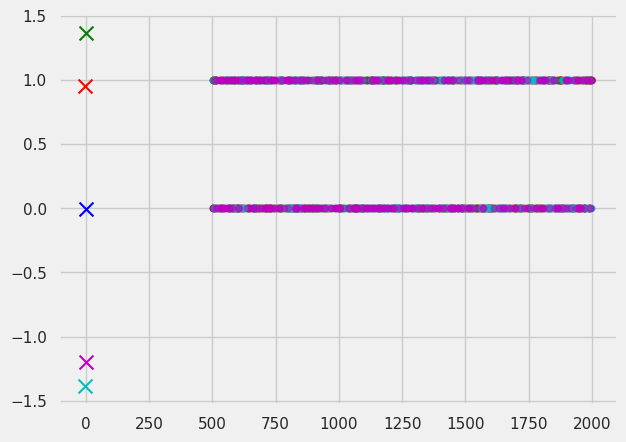

In [39]:
num_clusters = 5
display_cluster(df,km,num_clusters)

In [40]:
# Group by Class and K-means for comparsion between clustered classes and actual classes
(df[['price_range','k-means']]
 .groupby(['price_range','k-means'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))
### END SOLUTION


number
price_range k-means        
0           0            13
            2           266
            4           221
1           0           227
            1             9
            2           131
            3             1
            4           132
2           0           126
            1           200
            2             5
            3           163
            4             6
3           1           257
            3           243

Kmeans with 4 clusters:


In [ ]:
km = KMeans(n_clusters=4, random_state=42)
km = km.fit(X_PCA)
df['k-means'] = km.predict(X_PCA)
df.sample(7)
num_clusters = 4
display_cluster(df,km,num_clusters)

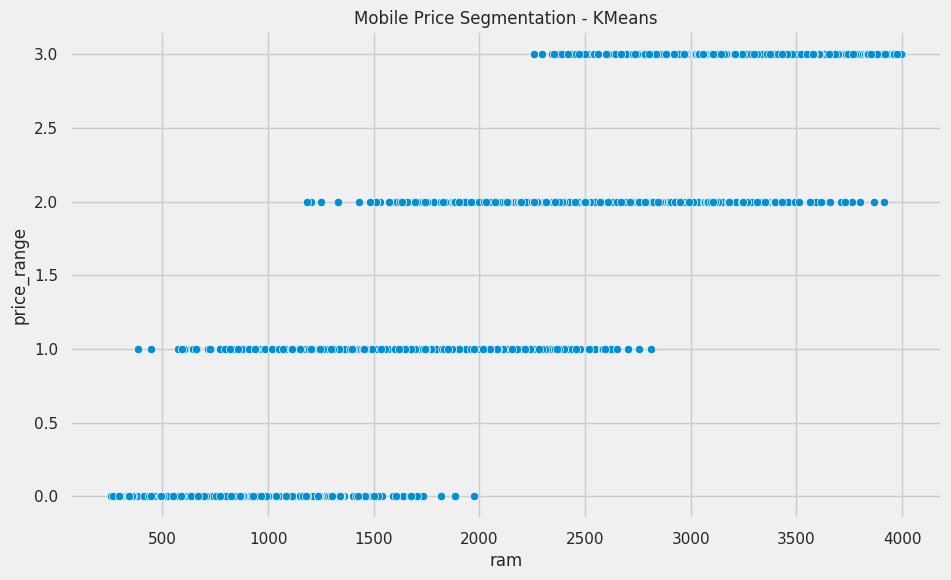

In [44]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['ram'], y=df['price_range'])
plt.title('Mobile Price Segmentation - KMeans')
plt.show()

### 2- Agglomerative Algorithm

In [45]:
from sklearn.cluster import AgglomerativeClustering
### BEGIN SOLUTION
ag = AgglomerativeClustering(n_clusters=5, linkage='ward', compute_full_tree=True)
ag = ag.fit(X_PCA)
df['agglom'] = ag.fit_predict(df[float_columns])

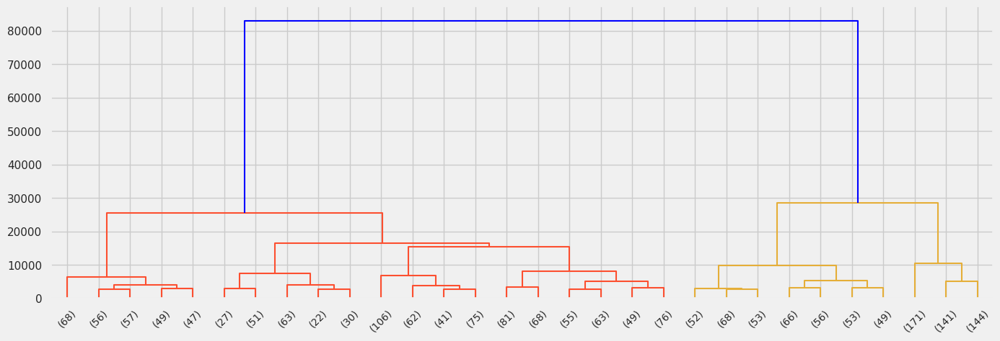

In [46]:
# First, we import the cluster hierarchy module from SciPy (described above) to obtain the linkage and dendrogram functions.
from scipy.cluster import hierarchy

Z = hierarchy.linkage(ag.children_, method='ward')

fig, ax = plt.subplots(figsize=(15,5))

den = hierarchy.dendrogram(Z, orientation='top',
                           p=30, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax,
                           above_threshold_color='blue')
### END SOLUTION

In [47]:
# First, for Agglomerative Clustering:
(df[['price_range','agglom']]
 .groupby(['price_range','agglom'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
price_range agglom        
0           1           59
            2            6
            3          313
            4          122
1           0           11
            1          201
            2          136
            3           20
            4          132
2           0          213
            1           99
            2          179
            4            9
3           0          438
            1            2
            2           60

### 3- MeanShift Algorithm


In [95]:
from sklearn.cluster import MeanShift
ms  = MeanShift(bandwidth=200, n_jobs=2)
ms = ms.fit(X_PCA)

In [96]:
np.unique(ms.labels_)

array([0])

In [81]:
df['MeanShift'] = ms.fit_predict(X_PCA)

In [82]:
(df[['price_range','MeanShift']]
 .groupby(['price_range','MeanShift'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,,number
price_range,MeanShift,
0,0,500
1,0,500
2,0,500
3,0,500


### 4- DBSCAN Algorithm


In [72]:
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps=0.6, min_samples=100, metric='euclidean')
dbs = dbs.fit(X_PCA)

In [73]:
np.unique(dbs.labels_)

array([-1,  0])

In [76]:
df['dbscan'] = dbs.fit_predict(X_PCA)

In [77]:
# First, for Agglomerative Clustering:
(df[['price_range','dbscan']]
 .groupby(['price_range','dbscan'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
price_range dbscan        
0           -1          74
             0         426
1           -1         112
             0         388
2           -1          50
             0         450
3           -1          61
             0         439

In [97]:
from sklearn.metrics import silhouette_score
#Evaluation
silhouette_avg_kmean = silhouette_score(X_scaled, df['k-means'])
silhouette_avg_hierarchical = silhouette_score(X_scaled, df['agglom'])
silhouette_avg_dbscan= silhouette_score(X_scaled, df['dbscan'])
# silhouette_avg_meanshift= silhouette_score(X_scaled, df['MeanShift'])
silhouette_avg_kmean, silhouette_avg_hierarchical, silhouette_avg_dbscan

(0.1843323629771631, 0.0384151136879382, 0.09610822159315366)